In [1]:
# Install package
%pip install --upgrade git+git://github.com/rahulspsec/portfoliotools.git

  Cloning git://github.com/rahulspsec/portfoliotools.git to /private/var/folders/5g/y08h4ccx7419m412xm4k361c0000gn/T/pip-req-build-z3v_yxen
  Running command git clone -q git://github.com/rahulspsec/portfoliotools.git /private/var/folders/5g/y08h4ccx7419m412xm4k361c0000gn/T/pip-req-build-z3v_yxen
  Found existing installation: portfoliotools 0.0.3
    Uninstalling portfoliotools-0.0.3:
      Successfully uninstalled portfoliotools-0.0.3
  Running setup.py install for portfoliotools ... done
You should consider upgrading via the 'pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [2]:
from portfoliotools.screener.stock_screener import StockScreener
from portfoliotools.screener.utility.util import get_ticker_list, getHistoricStockPrices, get_nse_index_list, get_port_ret_vol_sr
from portfoliotools.screener.stock_screener import PortfolioStrategy, ADF_Reg_Model
from tqdm import tqdm
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.graph_objects as go
import matplotlib.pyplot as plt
from IPython.display import display_html
from pandas.plotting import register_matplotlib_converters
from plotly.subplots import make_subplots
from datetime import datetime
import warnings
warnings.filterwarnings("ignore")
register_matplotlib_converters()
%matplotlib inline
sns.set()
pd.options.display.max_columns = None
pd.options.display.max_rows = None

### <font color = 'gray'>Portfolio Strategy Tools</font>

### <font color = 'blue'>Sector Analysis</font>

#### <font color = 'red'>USER INPUT</font>

In [3]:
#get_nse_index_list()
index_list = ['NIFTY BANK', 'NIFTY PHARMA', 'NIFTY FMCG',
             'NIFTY IT','NIFTY AUTO', 'NIFTY MEDIA', 'NIFTY METAL']
cob = datetime(2020,2,1) # COB Date

In [4]:
strat = PortfolioStrategy(index_list, period = 1000, cob = cob)

**Correlation Matrix**

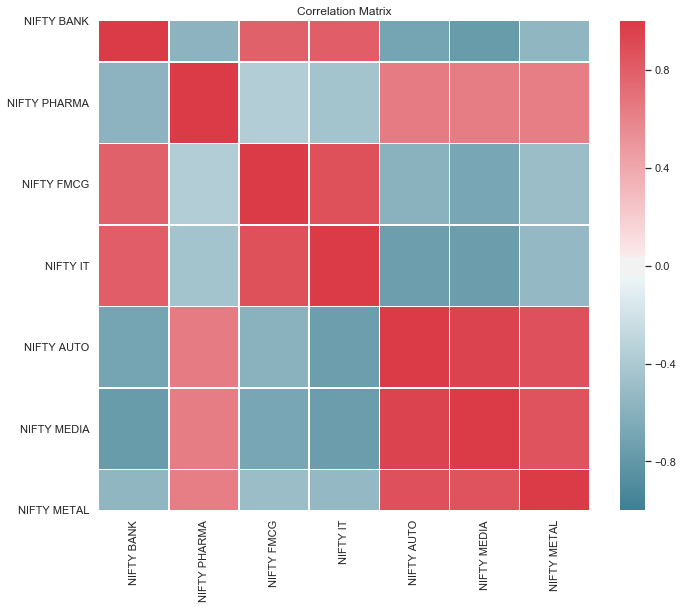

In [5]:
fig = strat.plot_correlation_matrix()
fig.show()

**Highly Correlated**

In [6]:
corr_pair = strat.get_correlation_pair()
print("Highly Correlated:")
display_html(corr_pair[corr_pair['Correlation'] > .90])
print("\nInversely Correlated:")
display_html(corr_pair[corr_pair['Correlation'] < -.70])

Highly Correlated:


,Stock 1,Stock 2,Correlation
0,NIFTY AUTO,NIFTY MEDIA,0.951994



Inversely Correlated:


,Stock 1,Stock 2,Correlation
18,NIFTY IT,NIFTY AUTO,-0.743496
19,NIFTY IT,NIFTY MEDIA,-0.755882
20,NIFTY BANK,NIFTY MEDIA,-0.765420


#### <font color = 'black'>Efficient Frontier</font>

In [7]:
market_portfolio = strat.get_efficient_market_portfolio(plot = True, num_ports = 50000, show_frontier =True) #plot =True to plot Frontier

#### Market Portfolio

,MP
NIFTY BANK (%),21.3000
NIFTY FMCG (%),20.0700
NIFTY IT (%),58.6300
Return,0.1420
Risk,0.1171
Sharpe,1.2120


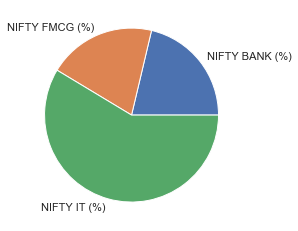

In [8]:
market_portfolio = market_portfolio.T
market_portfolio = market_portfolio[market_portfolio['MP'] != 0.00]
plt.pie(market_portfolio.iloc[:-3,0], labels=market_portfolio.index.tolist()[:-3])
market_portfolio

#### Return, Risk, Sharpe (Individual)

In [8]:
strat.calcStat(format_result = True)

,NIFTY BANK,NIFTY PHARMA,NIFTY FMCG,NIFTY IT,NIFTY AUTO,NIFTY MEDIA,NIFTY METAL
Period Start Date,2017-05-08 00:00:00,2017-05-08 00:00:00,2017-05-08 00:00:00,2017-05-08 00:00:00,2017-05-08 00:00:00,2017-05-08 00:00:00,2017-05-08 00:00:00
Period End Date,2020-02-01 00:00:00,2020-02-01 00:00:00,2020-02-01 00:00:00,2020-02-01 00:00:00,2020-02-01 00:00:00,2020-02-01 00:00:00,2020-02-01 00:00:00
Period Start Value,22767.3,10021,23442.2,10209.1,10167,3119.95,2854.35
Period End Value,29820.9,8013.75,30196.7,16282.6,7880.3,1755.9,2480.55
Return (ann.),10.03%,-8.31%,9.41%,17.35%,-9.47%,-21.37%,-5.22%
Risk (ann.),16.55%,19.98%,14.66%,16.29%,19.57%,26.14%,24.56%
Sharpe Ratio,0.606042,-0.415916,0.641883,1.06507,-0.483904,-0.817521,-0.212541
Best Day,8.31%,5.21%,4.41%,4.8%,9.9%,8.37%,5.68%
Worst Day,-3.28%,-4.37%,-6.73%,-4.68%,-3.95%,-16.37%,-5.02%
Max Drawdown,-15.47%,-32.94%,-17.51%,-15.01%,-43.68%,-53.13%,-47.48%


#### Screener Details

In [10]:
strat.get_screener_details()

ERROR:root:Error fetching 52 week high - NIFTY BANK
ERROR:root:Error fetching 52 week low - NIFTY BANK
ERROR:root:Error fetching 52 week low - NIFTY BANK
ERROR:root:Error fetching 52 week high - NIFTY BANK
ERROR:root:Error fetching 52 week low - NIFTY BANK
ERROR:root:Error fetching 52 week low - NIFTY BANK
ERROR:root:Error fetching 52 week high - NIFTY BANK
ERROR:root:Error fetching 52 week low - NIFTY BANK
ERROR:root:Error calculating ATR Results - NIFTY BANK
ERROR:root:Error calculating Renko Results - NIFTY BANK
ERROR:root:'EBITDA'
ERROR:root:Error calculating derived info NIFTY BANK
ERROR:root:Error fetching 52 week high - NIFTY PHARMA
ERROR:root:Error fetching 52 week low - NIFTY PHARMA
ERROR:root:Error fetching 52 week low - NIFTY PHARMA
ERROR:root:Error fetching 52 week high - NIFTY PHARMA
ERROR:root:Error fetching 52 week low - NIFTY PHARMA
ERROR:root:Error fetching 52 week low - NIFTY PHARMA
ERROR:root:Error fetching 52 week high - NIFTY PHARMA
ERROR:root:Error fetching 52 wee

,Stock Name,Date,Last Close,Last COB,Average Volume,Standard Deviation,CAGR,Annual Volatility,Sharpe,Sortino,52W High,52W Low,Price% 52 Week,Price per Range,Return 1D,Return 1W,Return 1M,Return 1Y,Smoothing Period,Lookback Period,%R,%D,WilliamR Signal,30D Moving Average,60D Moving Average,200D Moving Average,12D Exponential Moving Average,26D Exponential Moving Average,MACD Line,MACD Indicator,MACD Line to Indicator Diff (Value),MACD Line to Indicator Diff (Days),MACD Line to Indicator Diff Rolling Peak,MACD Line to Indicator Diff Rolling Peak per,MACD Signal,Bollinger Band Upper,Bollinger Band Middle,Bollinger Band Lower,RSI Value,RSI Signal,ATR Value,ADX Value,OBV Value,OBV Index,OBV Slope,OBV Signal,Slope Value,Renko Trend,Renko Strength,Renko Signal,Renko Date,EarningYield,FCFYield,ROC,BookToMkt,DivYield,Sector
0,NIFTY BANK,01Feb20,29820.90,01Feb20,2.471896e+08,452.24,8.94,18.18,0.299,0.515,-999,-999,1.797693e+308,100 %,-3.28,-3.30,-8.08,8.62,5,6,-95.39,-78.03,,31554.49,31549.66,30088.23,30859.63,31211.32,-351.69,-236.82,-114.87,-28,182.85,-62.82,,31371.31,30562.52,29753.72,21.33,BUY,514.43,47.00,7.617625e+09,30.82,0.94,,-89.70,,-999,,,-999,-999,-999,-999,-999,
1,NIFTY PHARMA,01Feb20,8013.75,01Feb20,2.295574e+07,183.03,-6.90,19.57,-0.532,-0.842,-999,-999,1.797693e+308,100 %,-1.53,-4.78,-0.50,-9.98,5,6,-92.95,-68.55,,8152.74,8077.34,8134.27,8225.29,8185.45,39.85,73.14,-33.29,-2,33.29,-100.00,,8543.01,8198.52,7854.03,22.48,BUY,186.89,44.44,-2.082734e+08,-9.07,-43.72,BUY,-89.47,,-999,,,-999,-999,-999,-999,-999,
2,NIFTY FMCG,01Feb20,30196.65,01Feb20,2.669341e+07,413.17,5.53,14.25,0.142,0.234,-999,-999,1.797693e+308,100 %,-1.88,-3.06,-0.23,-1.83,5,6,-87.90,-76.47,,30645.80,30733.69,30140.43,30911.96,30831.16,80.80,203.62,-122.81,-3,143.85,-85.37,,31635.89,30804.05,29972.22,25.85,BUY,526.98,29.17,5.819683e+08,21.80,-46.98,,-89.75,,-999,,,-999,-999,-999,-999,-999,
3,NIFTY IT,01Feb20,16282.65,01Feb20,3.266271e+07,236.58,13.34,17.33,0.568,0.827,-999,-999,1.797693e+308,100 %,0.86,-0.68,3.65,13.81,5,6,-48.45,-54.29,,16097.83,15671.77,15704.40,16297.31,16142.56,154.76,203.41,-48.65,-6,48.65,-100.00,,16549.21,16309.09,16068.98,47.99,,203.14,38.17,9.931909e+08,30.41,-8.70,,-89.09,,-999,,,-999,-999,-999,-999,-999,
4,NIFTY AUTO,01Feb20,7880.30,01Feb20,7.063264e+07,166.12,-17.48,21.78,-0.963,-1.560,-999,-999,1.797693e+308,100 %,-2.55,-4.58,-4.68,-11.08,5,8,-90.83,-84.72,,8199.80,8125.26,7861.49,8156.68,8172.96,-16.28,31.76,-48.05,-8,48.05,-100.00,,8382.38,8123.58,7864.78,25.48,BUY,166.22,28.35,-2.755992e+08,-3.90,-44.28,BUY,-89.16,,-999,,,-999,-999,-999,-999,-999,
5,NIFTY MEDIA,01Feb20,1755.90,01Feb20,4.368342e+07,67.00,-29.52,28.99,-1.139,-1.454,-999,-999,1.797693e+308,100 %,-4.33,-6.72,-2.49,-29.66,5,8,-96.47,-75.39,,1817.64,1819.27,1951.35,1837.56,1829.13,8.43,20.83,-12.40,-3,17.96,-69.02,,1918.88,1833.85,1748.81,28.77,BUY,40.26,29.00,6.708199e+07,1.54,-23.58,BUY,-87.64,,-999,,,-999,-999,-999,-999,-999,
6,NIFTY METAL,01Feb20,2480.55,01Feb20,9.724964e+07,71.94,-21.85,25.77,-0.984,-1.600,-999,-999,1.797693e+308,100 %,-3.44,-8.46,-13.57,-16.51,5,8,-94.09,-92.96,,2770.25,2675.51,2676.12,2675.37,2716.91,-41.54,5.75,-47.29,-11,47.29,-100.00,,2842.05,2635.42,2428.79,17.38,BUY,71.27,44.54,-1.207083e+09,-12.41,-39.61,,-88.64,,-999,,,-999,-999,-999,-999,-999,


### <font color = 'blue'>Market Cap</font>

#### <font color = 'red'>USER INPUT</font>

In [11]:
index_list = ['NIFTY 50', 'NIFTY MIDCAP 50', 'NIFTY SMLCAP 100']

In [12]:
strat = PortfolioStrategy(index_list, period = 1000, cob = cob)

**Correlation Matrix**

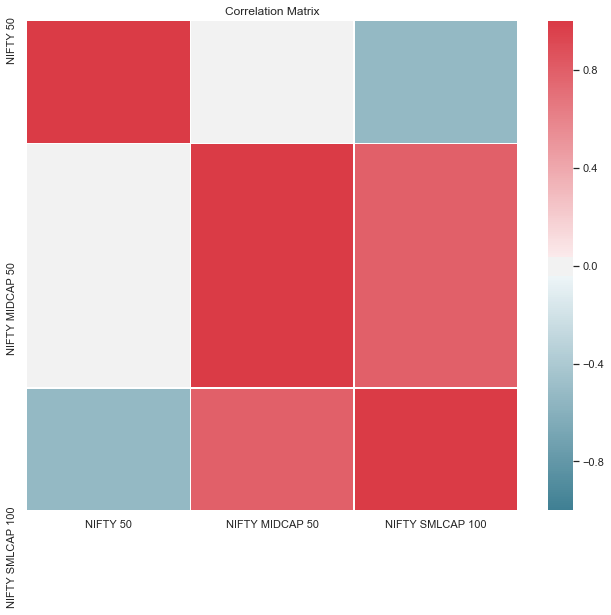

In [13]:
fig = strat.plot_correlation_matrix()
fig.show()

**Highlt Correlated**

In [14]:
corr_pair = strat.get_correlation_pair()
print("Highly Correlated:")
display_html(corr_pair[corr_pair['Correlation'] > .90])
print("\nInversely Correlated:")
display_html(corr_pair[corr_pair['Correlation'] < -.70])

Highly Correlated:


,Stock 1,Stock 2,Correlation



Inversely Correlated:


,Stock 1,Stock 2,Correlation


**Efficient Frontier**

In [15]:
market_portfolio = strat.get_efficient_market_portfolio(plot = True, num_ports = 50000, show_frontier =True) #plot =True to plot Frontier

**Market Portfolio**

,MP
NIFTY 50 (%),100.0000
Return,0.0836
Risk,0.1246
Sharpe,0.6705


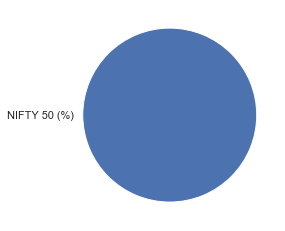

In [16]:
market_portfolio = market_portfolio.T
market_portfolio = market_portfolio[market_portfolio['MP'] != 0.00]
plt.pie(market_portfolio.iloc[:-3,0], labels=market_portfolio.index.tolist()[:-3])
market_portfolio

**Return,Risk,Sharpe (Individual Index)**

In [17]:
strat.get_details()

,Name,Return,Risk,Sharpe
0,NIFTY 50,0.083554,0.124613,0.670506
1,NIFTY MIDCAP 50,0.006797,0.188157,0.036123
2,NIFTY SMLCAP 100,-0.081755,0.191826,-0.426195


**Screener Details**

In [18]:
strat.get_screener_details()

ERROR:root:Error fetching 52 week high - NIFTY 50
ERROR:root:Error fetching 52 week low - NIFTY 50
ERROR:root:Error fetching 52 week low - NIFTY 50
ERROR:root:Error fetching 52 week high - NIFTY 50
ERROR:root:Error fetching 52 week low - NIFTY 50
ERROR:root:Error fetching 52 week low - NIFTY 50
ERROR:root:Error fetching 52 week high - NIFTY 50
ERROR:root:Error fetching 52 week low - NIFTY 50
ERROR:root:Error calculating ATR Results - NIFTY 50
ERROR:root:Error calculating Renko Results - NIFTY 50
ERROR:root:'EBITDA'
ERROR:root:Error calculating derived info NIFTY 50
ERROR:root:Error fetching 52 week high - NIFTY MIDCAP 50
ERROR:root:Error fetching 52 week low - NIFTY MIDCAP 50
ERROR:root:Error fetching 52 week low - NIFTY MIDCAP 50
ERROR:root:Error fetching 52 week high - NIFTY MIDCAP 50
ERROR:root:Error fetching 52 week low - NIFTY MIDCAP 50
ERROR:root:Error fetching 52 week low - NIFTY MIDCAP 50
ERROR:root:Error fetching 52 week high - NIFTY MIDCAP 50
ERROR:root:Error fetching 52 week

,Stock Name,Date,Last Close,Last COB,Average Volume,Standard Deviation,CAGR,Annual Volatility,Sharpe,Sortino,52W High,52W Low,Price% 52 Week,Price per Range,Return 1D,Return 1W,Return 1M,Return 1Y,Smoothing Period,Lookback Period,%R,%D,WilliamR Signal,30D Moving Average,60D Moving Average,200D Moving Average,12D Exponential Moving Average,26D Exponential Moving Average,MACD Line,MACD Indicator,MACD Line to Indicator Diff (Value),MACD Line to Indicator Diff (Days),MACD Line to Indicator Diff Rolling Peak,MACD Line to Indicator Diff Rolling Peak per,MACD Signal,Bollinger Band Upper,Bollinger Band Middle,Bollinger Band Lower,RSI Value,RSI Signal,ATR Value,ADX Value,OBV Value,OBV Index,OBV Slope,OBV Signal,Slope Value,Renko Trend,Renko Strength,Renko Signal,Renko Date,EarningYield,FCFYield,ROC,BookToMkt,DivYield,Sector
0,NIFTY 50,01Feb20,11661.85,01Feb20,3.993827e+08,131.15,6.53,13.52,0.224,0.374,-999,-999,1.797693e+308,100 %,-2.51,-3.77,-5.05,8.03,5,8,-95.53,-89.47,,12171.54,12091.04,11654.89,12053.26,12111.63,-58.37,4.94,-63.31,-10,63.31,-100.00,,12357.08,11997.72,11638.37,20.92,BUY,161.62,33.45,1.096244e+10,27.45,-44.86,,-89.40,,-999,,,-999,-999,-999,-999,-999,
1,NIFTY MIDCAP 50,01Feb20,4762.60,01Feb20,2.762457e+08,85.61,-5.74,19.52,-0.474,-0.770,-999,-999,1.797693e+308,100 %,-3.11,-4.99,-0.71,-2.32,5,8,-94.06,-66.64,,4828.58,4727.11,4633.53,4920.43,4864.91,55.52,83.40,-27.88,-3,27.88,-100.00,,5098.66,4920.65,4742.65,29.44,BUY,89.01,39.65,8.016010e+09,29.02,-31.74,,-88.98,,-999,,,-999,-999,-999,-999,-999,
2,NIFTY SMLCAP 100,01Feb20,6057.05,01Feb20,3.066432e+08,109.67,-61.01,22.03,-2.928,-5.465,-999,-999,1.797693e+308,100 %,-0.97,-2.18,-999.00,-999.00,5,8,-67.44,-79.82,,6062.48,5881.09,5911.34,6215.60,6121.38,7903.93,6209.19,1694.74,7,7174.14,23.62,,8067.73,7857.85,7647.98,36.24,,161.01,49.03,-2.667079e+08,-0.87,10.30,,81.61,,-999,,,-999,-999,-999,-999,-999,
